In [51]:
#@title Import Library
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import glob
import os
from scipy.signal import fftconvolve,firwin, freqz,lfilter,lfilter_zi,firls
import tensorflow as tf
from tqdm.notebook import tnrange, tqdm, tqdm_notebook
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)
from ipywidgets import FloatProgress
#@title Import
import tensorflow as tf
from tensorflow.keras.metrics import Mean
from tensorflow.keras.losses import mse
from tensorflow.keras.models import load_model, save_model

import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import Callback

from tensorflow.keras.layers import Dense, Dropout, Flatten, Reshape, LeakyReLU, Conv1D, MaxPooling1D, Activation, Input, UpSampling1D, BatchNormalization, Lambda, Concatenate, Layer, Embedding, Conv1DTranspose, AveragePooling1D, LayerNormalization
from tensorflow.keras.models import Model, load_model
import numpy as np
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from tensorflow.keras.optimizers.legacy import Adam
import os
from matplotlib import pyplot as plt

In [2]:
electrodes = ['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3',' FC1', 'C1', 'C3','C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1','P1','P3', 'P5', 'P7', 'P9', 'RO7', 'PO3', 'O1', 'Iz','Oz','POz', 'Pz', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ','FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz','Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10','PO8', 'PO4', 'O2','EMG1','EMG2','EMG3','EMG4']
electrodes.reverse()
path = "/Users/mdraihanmia/Ubicomp/PMNL/MotEv/Research/MOTOR IMAGERY/Dataset/cho_et_al_data/raw/"
data_paths = {'raw': "raw/", 
              'preprocessed': "preprocessed/",  
              'saved_models': "saved_models/", 
              'tensorboard_logs': "tensorboard_logs/", 
              'reports': "reports/", 
              'classification_reports': "reports/classification_reports/", 
              'preprocessing_reports': "reports/preprocessing_reports/", 
              }

In [45]:
Fs = 512
patients = 52                       # no._of_patients (MAX 52)
segment_length = 3                  # in_seconds
alpha = False                       # Only_alpha_rhythm
concat = False                      # Keep_channel_dimension
channels = ['FC3']                  # channels_to_keep
is_gp = False                  # is gradient panelty activate?
batch_size = 256
epochs = 10
latent_dim = 200
d_extra_steps = 3
gp_weight = 10.0

In [3]:
#@title Preprocessing Functions
def bandpass_firls(xn, lowcut2,lowcut1, highcut1, highcut2, fs):
    nyq = 0.5 * fs
    ntaps = fs if fs%2==1 else fs+1
    b = firls(ntaps, [0 ,lowcut2,lowcut1, highcut1, highcut2,nyq], [0,0,1,1,0,0] ,fs=fs)
    a=1
    zi = lfilter_zi(b, a)
    z, _ = lfilter(b, a, xn,zi=zi*xn[0])
    return z

def band_separate(data, fs, ntaps):
    delta = bandpass_firls(data,ntaps,0.1,0.5, 4, 5, fs)
    theta = bandpass_firls(data,ntaps,3.5,4, 8, 8.5, fs)
    alpha = bandpass_firls(data,ntaps,7,8, 12, 13, fs)
    sigma = bandpass_firls(data,ntaps,11.5,12, 16, 16.5, fs)
    beta = bandpass_firls(data,ntaps,15.5,16, 30, 30.5, fs)
    return delta, theta, alpha, sigma, beta

def filter_alpha(data, Fs):
  d = []
  for i in range (data.shape[0]):
    alpha = bandpass_firls(data[i], 7,8, 12, 13, Fs)
    d.append(alpha)
  data = np.stack(d, axis  = 0)
  return data

In [4]:
#@title Dataset Functions
def struct2dict(mat):
  data = dict()
  key = list(mat.keys())[-1]
  for i in range(len(mat[key][0,0])):
    data[mat[key][0,0].dtype.descr[i][0]] = mat[key][0,0][i]
  return data

def channel_normalize(data, axis):
  mean = np.expand_dims(data.mean(axis = axis), axis = axis)
  diff = np.expand_dims(data.max(axis = axis)- data.min(axis = axis), axis = axis)
  data = (data - mean)/diff
  return data

def import_data(file):
  mat = sio.loadmat(file)
  mat = struct2dict(mat)
  return mat

def preprocess(data,  Fs, seconds,  alpha, concat):
  if alpha:
    data = filter_alpha(data, Fs)
  data = channel_normalize(data, axis = 1)
  channels = data.shape[0]
  length = seconds*Fs
  data = data[:, data.shape[1]%length :]
  if concat:
    data = data.T.reshape(-1, length, channels)
  else:
    data = data.reshape(-1,length,1)
  return data

def channel_selector(data, channels, concat, electrodes):
  index = []
  if isinstance(channels, list):
    for channel in channels:
      try:
        index.append(electrodes.index(channel))
      except ValueError:
        print('channel doesn\'t exist')
    
    data = data[index]
  return data

def create_dataset(files, Fs, seconds, alpha, channels, concat, electrodes):
  data = []
  labels=[]
  for i in tnrange(len(files)):
    mat = import_data(files[i])
    d1 = mat['movement_left']
    d2 = mat['movement_right']

    d1 = channel_selector(d1, channels, concat, electrodes)
    d1 = preprocess(d1,  Fs, seconds,  alpha, concat)

    d2 = channel_selector(d2, channels, concat, electrodes)
    d2 = preprocess(d2,  Fs, seconds,  alpha, concat)

    data.append(d1)
    data.append(d2)

    l1 = np.zeros((d1.shape[0],1))
    l2 = np.ones((d2.shape[0],1))

    labels.append(l1)
    labels.append(l2)

  data = np.concatenate(data)
  labels = np.concatenate(labels)
  return data, labels

In [58]:
#@title Visualizaton Functions
def normalize(data):
  mean = data.mean()
  diff = data.max()- data.min()
  data = (data - mean)/diff
  return data

def show_real_eeg_signal(Xf, samples, fs = 512, seconds = 3, sensitivity = 4, spacing= 4, mode = 'norm'):
  Xf = Xf[:,:seconds*fs].T
  
  if mode == 'max':
    Xf = normalize(Xf)*sensitivity
  else:
    Xf = channel_normalize(Xf, axis = 1)*sensitivity
  ch_len = Xf.shape[1]
#   print(ch_len)
  ch_names = ['Real {}'.format(i) for i in range(samples)]
  t = np.arange(seconds*fs)
  plt.figure(figsize=(5*seconds,ch_len))
  plt.plot(t,Xf+np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing)
  plt.xlim([t[0],t[-1]])
  plt.xlabel('time (sec)')
  plt.yticks(np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing, ch_names)
  plt.grid()
  plt.title('Real Signal of FC3 Channel')
  plt.show()

def show_generated_eeg_signal(Xf, samples, fs = 512, seconds = 3, sensitivity = 4, spacing= 4, mode = 'norm'):
  Xf = Xf[:,:seconds*fs].T
  
  if mode == 'max':
    Xf = normalize(Xf)*sensitivity
  else:
    Xf = channel_normalize(Xf, axis = 1)*sensitivity
  ch_len = Xf.shape[1]
  ch_names = ['preds {}'.format(i) for i in range(samples)]
#   print(ch_len)
  t = np.arange(seconds*fs)
  plt.figure(figsize=(5*seconds,ch_len))
  plt.plot(t,Xf+np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing)
  plt.xlim([t[0],t[-1]])
  plt.xlabel('time (sec)')
  plt.yticks(np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing, ch_names)
  plt.grid()
  plt.title('Generated Signal of FC3 Channel')
  plt.show()

In [9]:
#@title Dataset Creation
files = glob.glob(path + '/*.mat')
# print(files)
data, labels = create_dataset(files[:patients], Fs = Fs, seconds = segment_length, alpha = alpha, channels = channels, concat = concat, electrodes = electrodes)

  0%|          | 0/52 [00:00<?, ?it/s]

In [14]:
data_mean = np.mean(data)
data_std = np.std(data)
trial_shape = data[0].shape
dataset = tf.data.Dataset.from_tensor_slices(data)
dataset = dataset.shuffle(1024).batch(batch_size)


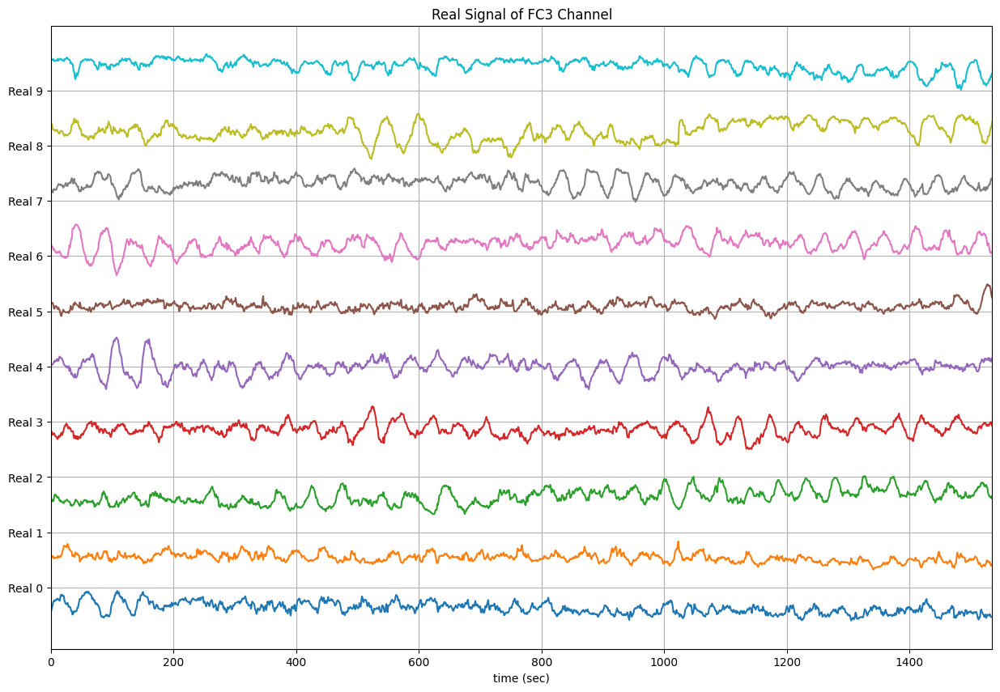

In [44]:
data.shape
show_real_eeg_signal(data[:10,:,0], samples=10)

## Generated by EEG-GAN (CNN based)

In [131]:
save_path = '/Users/mdraihanmia/Ubicomp/PMNL/MotEv/Research/MOTOR IMAGERY/Programming/EEG-GAN/savemodels/EEG_GAN_2/'
discriminator_save_path = os.path.join(save_path, 'discriminator.h5')
generator_save_path = os.path.join(save_path, 'generator.h5')

In [119]:
def model_load(save_path):
  discriminator_save_path = os.path.join(save_path, 'discriminator.h5')
  generator_save_path = os.path.join(save_path, 'generator.h5')
  generator = load_model(generator_save_path)
  discriminator = load_model(discriminator_save_path) 
  return generator, discriminator

In [132]:
generator, discriminator = model_load(save_path)

In [133]:
batch_size = 10
latent_vectors = tf.random.normal(shape=(batch_size, latent_dim)) ## 
preds = generator(latent_vectors)
preds.shape

TensorShape([10, 1536, 1])

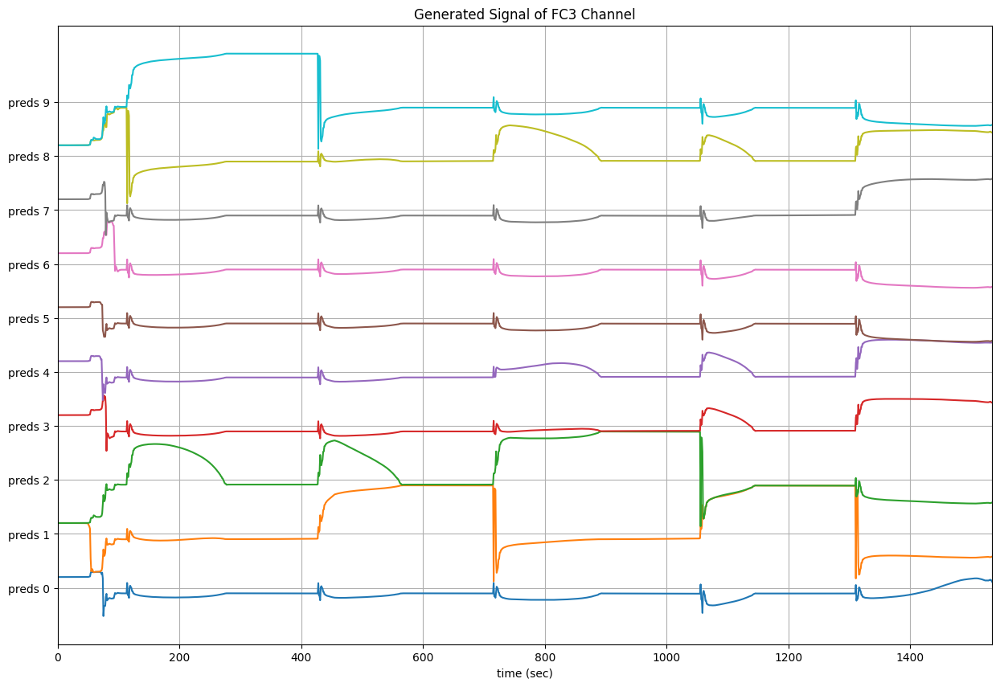

In [134]:
show_generated_eeg_signal(preds[:,:,0].numpy(), samples=batch_size)

## Generated by CNN-WGAN

In [114]:
def show_eeg_signal(Xf, ch_names, fs, seconds, sensitivity, spacing, mode = 'norm'):
  Xf = Xf[:,:seconds*fs].T
  if mode == 'max':
    Xf = normalize(Xf)*sensitivity
  else:
    Xf = channel_normalize(Xf, axis = 1)*sensitivity
  ch_len = Xf.shape[1]
  print(ch_len)
  t = np.arange(seconds*fs)
  plt.figure(figsize=(5*seconds,ch_len))
  plt.plot(t,Xf+np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing)
  plt.xlim([t[0],t[-1]])
  plt.xlabel('time (sec)')
  plt.yticks(np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing,ch_names)
  plt.grid()
  plt.title('68 channel - EEG Signal')
  plt.show()

In [98]:
model = load_model('/Users/mdraihanmia/Ubicomp/PMNL/MotEv/Research/MOTOR IMAGERY/Programming/EEG-GAN/savemodels/Saved_Model_4/generator')
synth_latent_points = np.random.randn(10, 160)
synth_labels = np.zeros((10,2))
preds = model.predict([synth_latent_points, synth_labels])

1/1 [==============================] - 0s 385ms/step


In [92]:
preds.shape

(10, 2560, 68)

68


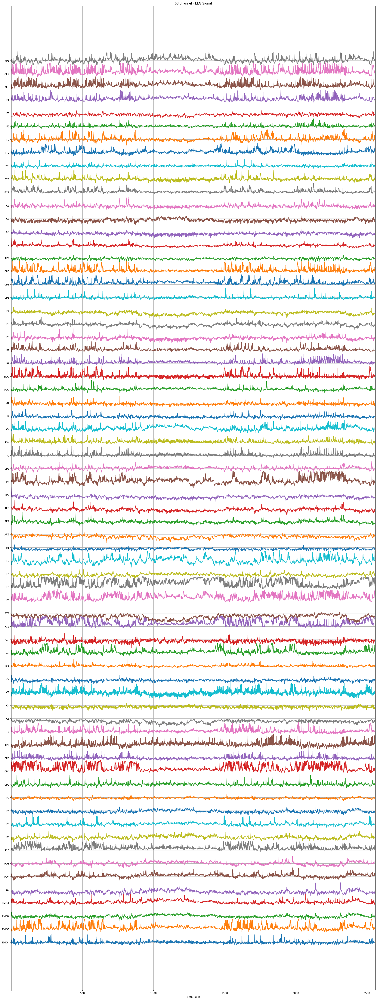

In [115]:
show_eeg_signal(preds[2].T, electrodes, 512, 5, 4 ,4)

68


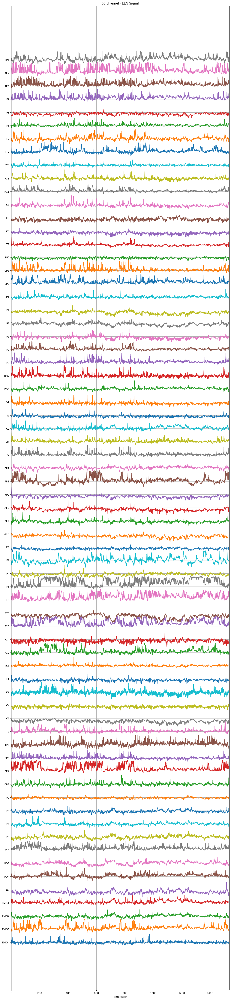

In [116]:
show_eeg_signal(preds[1,:1536,:].T, electrodes, 512, 3, 4 ,4)

58


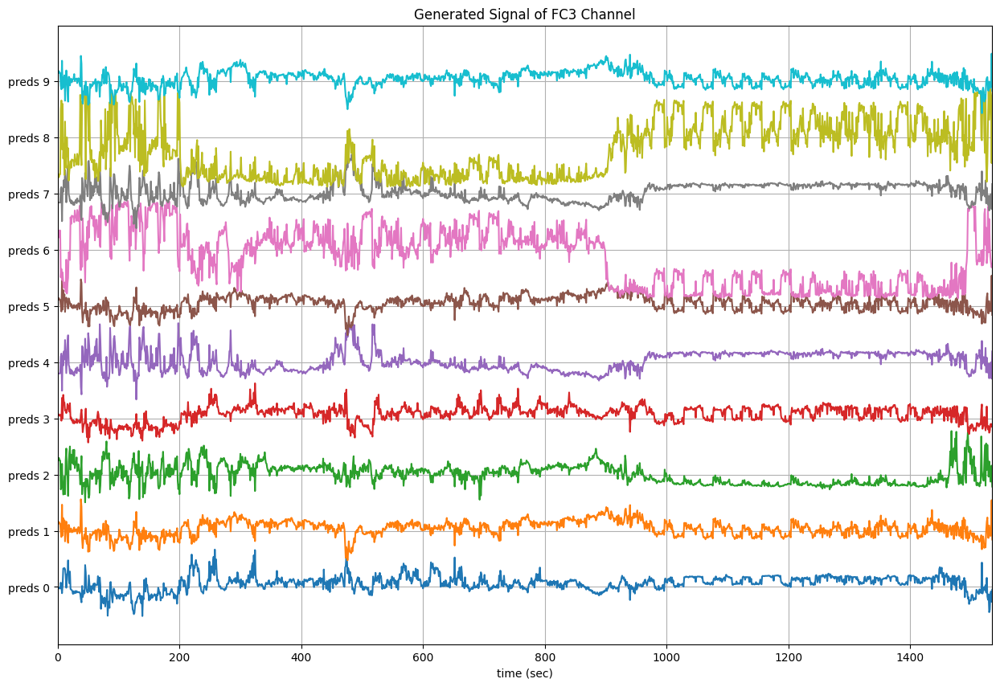

In [117]:
fc3 = electrodes.index('FC3')
print(fc3)
show_generated_eeg_signal(preds[:10,:1536,fc3], samples=10)

## Generated by BiGRU-GAN

In [142]:
save_path = '/Users/mdraihanmia/Ubicomp/PMNL/MotEv/Research/MOTOR IMAGERY/Programming/EEG-GAN/savemodels/BiGRU-GAN/'
discriminator_save_path = os.path.join(save_path, 'discriminator.h5')
generator_save_path = os.path.join(save_path, 'generator.h5')

In [143]:
generator, discriminator = model_load(save_path)

2023-05-03 14:56:00.805086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 14:56:00.816853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 14:56:00.819923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-05-03 14:56:03.273455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 14:56:03.275644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 14:56:03.278376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-05-03 14:56:04.224727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 14:56:04.226568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 14:56:04.228021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [144]:
batch_size = 10
latent_vectors = tf.random.normal(shape=(batch_size ,1536, 200)) ## 
preds = generator(latent_vectors)
preds.shape

TensorShape([10, 1536, 1])

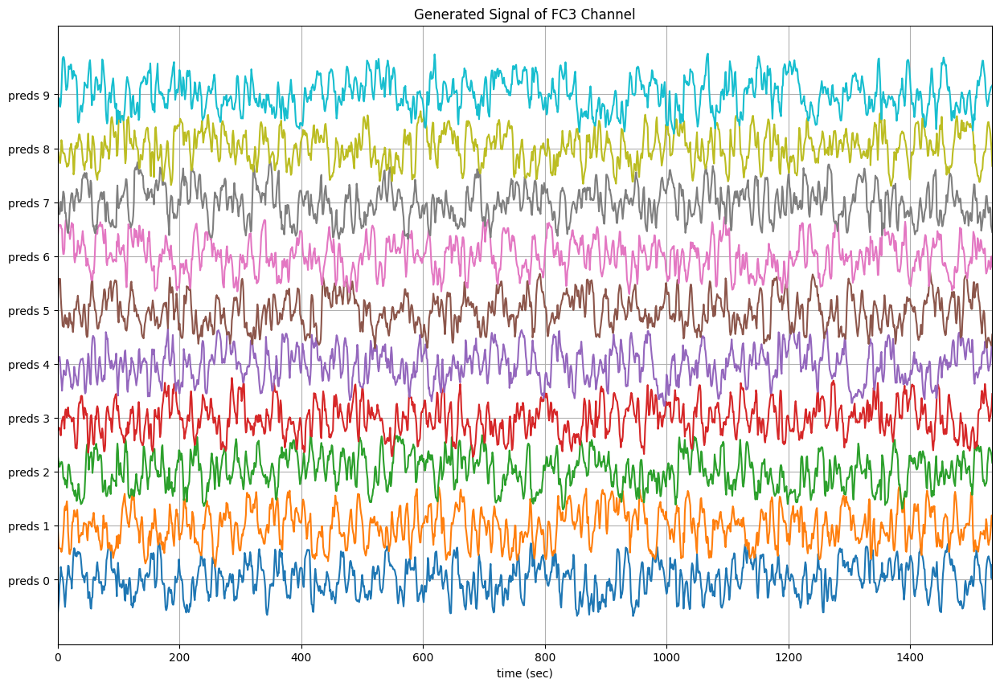

In [145]:
show_generated_eeg_signal(preds[:,:,0].numpy(), samples=batch_size)

## BiGRU-GAN in Alpha-Band

In [149]:
save_path = '/Users/mdraihanmia/Ubicomp/PMNL/MotEv/Research/MOTOR IMAGERY/Programming/EEG-GAN/savemodels/BiLSTM-GAN-Alpha/'
discriminator_save_path = os.path.join(save_path, 'discriminator.h5')
generator_save_path = os.path.join(save_path, 'generator.h5')

In [150]:
batch_size = 10
latent_vectors = tf.random.normal(shape=(batch_size ,1536, 200)) ## 
preds = generator(latent_vectors)
preds.shape

TensorShape([10, 1536, 1])

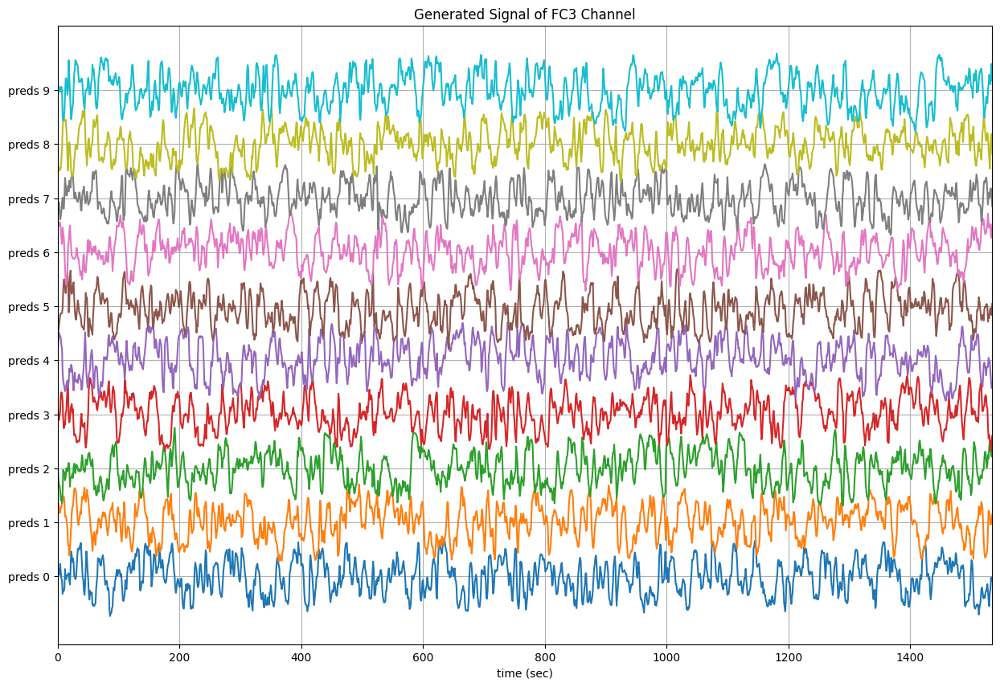

In [151]:
show_generated_eeg_signal(preds[:,:,0].numpy(), samples=batch_size)